In [173]:
# !pip install pandas numpy matplotlib pycocotools scikit-learn scikit-image seaborn

In [ ]:
!pip install seaborn

In [203]:
import json
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
import pdb
import os
from pycocotools.coco import COCO
from skimage import io
import cv2
import random
import seaborn as sns

font = {'family' : 'Arial',
        'weight' : 'normal',
        'size'   : 12}

matplotlib.rc('font', **font)

In [176]:
src_root = '../../data/Traffic-Signs-Detection-Europe-14/'
dataset_folders = ['train/', 'valid/']

for folder in dataset_folders:
    print(src_root+folder)

../../data/Traffic-Signs-Detection-Europe-14/train/
../../data/Traffic-Signs-Detection-Europe-14/valid/


In [177]:
train_file_json = r'../../data/Traffic-Signs-Detection-Europe-14/train/_annotations.coco.json'
val_file_json = r'../../data/Traffic-Signs-Detection-Europe-14/valid/_annotations.coco.json'

In [178]:
pwd

'd:\\Projects\\Interview\\phonologies\\assignment\\code\\Data_analysis'

In [179]:
train_file_json_data = json.load(open(train_file_json))
val_file_json_data = json.load(open(val_file_json))

In [180]:
train_file_json_data.keys()

dict_keys(['info', 'licenses', 'categories', 'images', 'annotations'])

In [181]:
classes_df = pd.DataFrame(train_file_json_data['categories'])
print(classes_df.shape)
classes_df.rename(columns = {'id':'category_id'}, inplace = True)
classes_df.head(2)

(56, 3)


,category_id,name,supercategory
0,0,Traffic-sings,none
1,1,forb_ahead,Traffic-sings


In [182]:
train_images_info_df = pd.DataFrame(train_file_json_data['images'])
print(train_images_info_df.shape)
train_images_info_df.rename(columns = {'id':'image_id'}, inplace = True)
train_images_info_df.head(5)

(3253, 7)


,image_id,license,file_name,height,width,date_captured,extra
0,0,1,AUTO_COLLECTED_PICTURE_76_png.rf.005872ad06f47...,640,640,2024-05-29T17:18:05+00:00,NaN
1,1,1,SNAG2-RADU-0233_png.rf.0041e721a3f4dd1b429c0bd...,640,640,2024-05-29T17:18:05+00:00,NaN
2,2,1,SNAG2-RADU-0048_png.rf.0004fd48258f306f67bea90...,640,640,2024-05-29T17:18:05+00:00,NaN
3,3,1,SNAG12-RADU_412_png.rf.01b8d9d33f7834fb23b343c...,640,640,2024-05-29T17:18:05+00:00,NaN
4,4,1,SNAG8-RADU-0052_png.rf.00217c1b982274cf5611b64...,640,640,2024-05-29T17:18:05+00:00,NaN


In [183]:
print(train_images_info_df['file_name'].nunique())

3253


In [184]:
print(train_images_info_df.height.value_counts())
print(train_images_info_df.width.value_counts())

height
640    3253
Name: count, dtype: int64
width
640    3253
Name: count, dtype: int64


In [185]:
print(train_images_info_df.date_captured.value_counts())

date_captured
2024-05-29T17:18:05+00:00    3253
Name: count, dtype: int64


In [186]:
# # Train dataset statistics
# - In total there are 3253 images all images are unique and of size 640x640
# - In total there are 55 classes

In [187]:
train_annotations_df = pd.DataFrame(train_file_json_data['annotations'])
print(train_annotations_df.shape)
train_annotations_df.head(2)

(6133, 7)


,id,image_id,category_id,bbox,area,segmentation,iscrowd
0,0,0,44,"[268, 285, 28, 24]",672.0,[],0
1,1,1,2,"[17, 270, 242, 252]",60984.0,[],0


In [188]:
train_annotations_df = train_annotations_df.merge(train_images_info_df[['file_name', 'image_id']], left_on='image_id', right_on='image_id')
train_annotations_df = train_annotations_df.merge(classes_df[['category_id', 'name']], on='category_id')

In [192]:
train_annotations_df.head(2)
print(train_annotations_df.shape)
train_annotations_df.head(2)

(6133, 9)


,id,image_id,category_id,bbox,area,segmentation,iscrowd,file_name,name
0,0,0,44,"[268, 285, 28, 24]",672.0,[],0,AUTO_COLLECTED_PICTURE_76_png.rf.005872ad06f47...,warn_crosswalk
1,1,1,2,"[17, 270, 242, 252]",60984.0,[],0,SNAG2-RADU-0233_png.rf.0041e721a3f4dd1b429c0bd...,forb_left


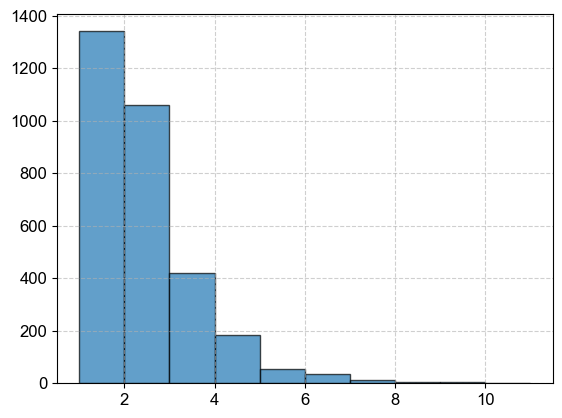

In [200]:
plt.hist(train_annotations_df.file_name.value_counts(), bins=10, edgecolor='black', alpha=0.7)
# Add grid for better readability
plt.grid(True, linestyle='--', alpha=0.6)
# Show the plot
plt.show()

In [ ]:
# plot co-occurance between classes
train_annotations_df['name'].value_counts().plot(kind='bar')
plt.show()

In [ ]:
# plot co-occurance between classes
annotate_names = train_annotations_df.name.unique()
co_occurrence_matrix = pd.DataFrame(0, index=annotate_names, columns=annotate_names)

# Fill the matrix
for image, group in train_annotations_df.groupby('image_id'):
    parts = group['name'].tolist()
    for i in range(len(parts)):
        for j in range(i, len(parts)):
            co_occurrence_matrix.loc[parts[i], parts[j]] += 1
            if i != j:
                co_occurrence_matrix.loc[parts[j], parts[i]] += 1

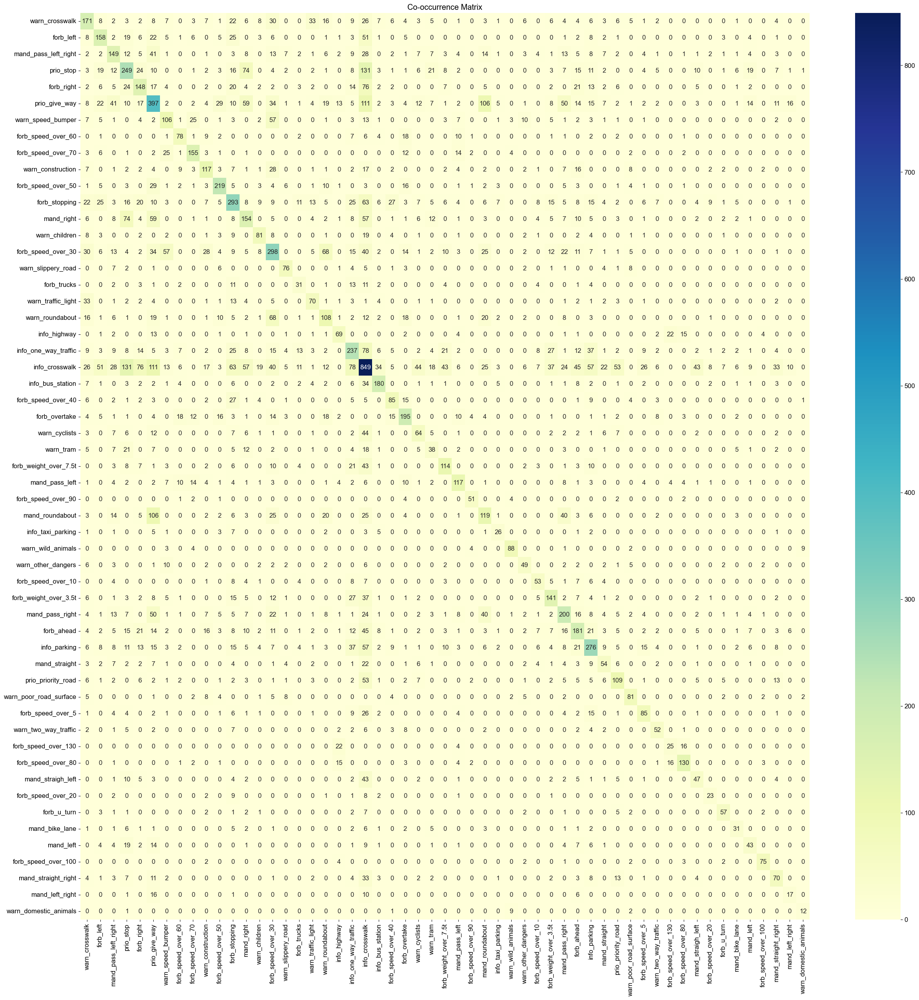

In [215]:
# Plot the matrix
plt.figure(figsize=(30, 30))
sns.heatmap(co_occurrence_matrix, annot=True, fmt="d", cmap="YlGnBu")
plt.title('Co-occurrence Matrix')
plt.show()

In [69]:
print(train_annotations_df.name.value_counts())

name
info_crosswalk            659
prio_give_way             329
forb_speed_over_30        276
forb_stopping             253
prio_stop                 233
info_one_way_traffic      213
info_parking              206
forb_overtake             183
info_bus_station          178
forb_ahead                169
warn_crosswalk            163
mand_pass_right           162
forb_left                 154
forb_speed_over_50        153
mand_right                150
forb_right                146
forb_weight_over_3.5t     131
mand_pass_left_right      131
warn_construction         107
forb_weight_over_7.5t     106
warn_speed_bumper         104
warn_roundabout           104
forb_speed_over_70        103
mand_roundabout            99
prio_priority_road         91
forb_speed_over_5          85
forb_speed_over_40         83
warn_wild_animals          82
forb_speed_over_80         80
warn_children              75
warn_poor_road_surface     75
forb_speed_over_60         72
warn_traffic_light         68
mand_

In [219]:
# plot boxes on image
def plot_box_on_image(image_path, bbox):    
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # cv2.rectangle(img, (bbox[0], bbox[1]), (bbox[0]+bbox[2], bbox[1]+bbox[3]), (255, 0, 0), 2)
    cv2.rectangle(img, (int(bbox[0]), int(bbox[1])), (int(bbox[0]+bbox[2]), int(bbox[1]+bbox[3])), (255, 0, 0), 2)

    plt.imshow(img)
    # hide grid
    plt.grid(False)
    plt.axis('off')

class is : warn_crosswalk
AUTO_COLLECTED_PICTURE_76_png.rf.005872ad06f473beae0219343ac2cc2b.jpg


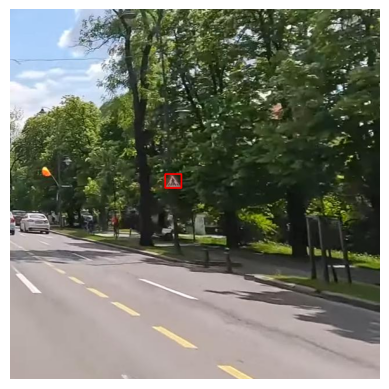

class is : forb_left
SNAG2-RADU-0233_png.rf.0041e721a3f4dd1b429c0bde98b3c007.jpg


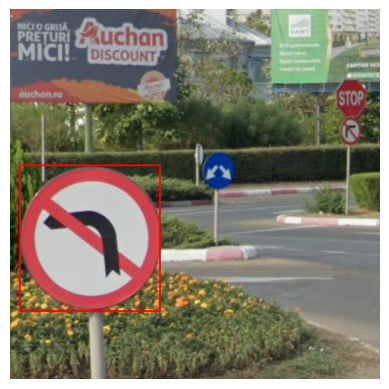

class is : mand_pass_left_right
SNAG2-RADU-0233_png.rf.0041e721a3f4dd1b429c0bde98b3c007.jpg


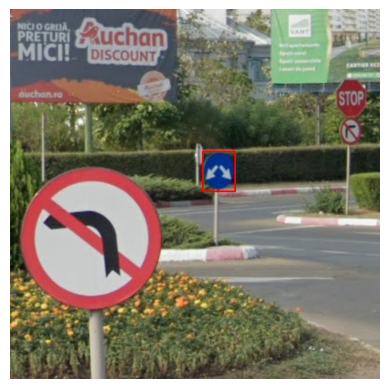

class is : prio_stop
SNAG2-RADU-0233_png.rf.0041e721a3f4dd1b429c0bde98b3c007.jpg


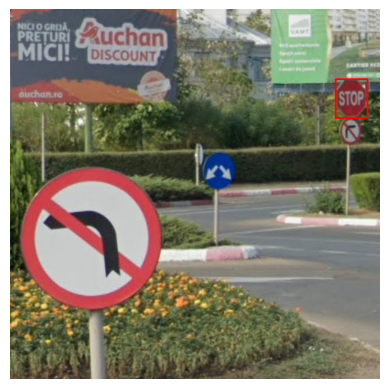

class is : forb_right
SNAG2-RADU-0233_png.rf.0041e721a3f4dd1b429c0bde98b3c007.jpg


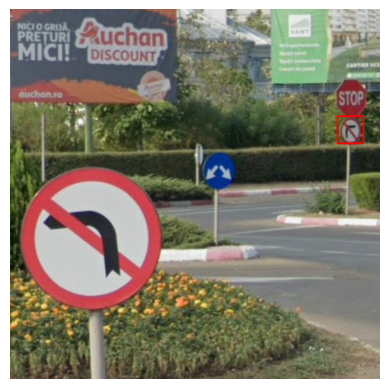

class is : prio_give_way
SNAG2-RADU-0048_png.rf.0004fd48258f306f67bea90f690bc522.jpg


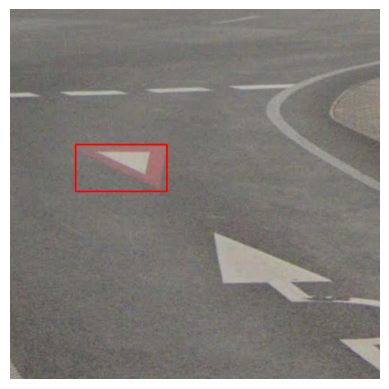

class is : warn_speed_bumper
SNAG12-RADU_412_png.rf.01b8d9d33f7834fb23b343c63c741a32.jpg


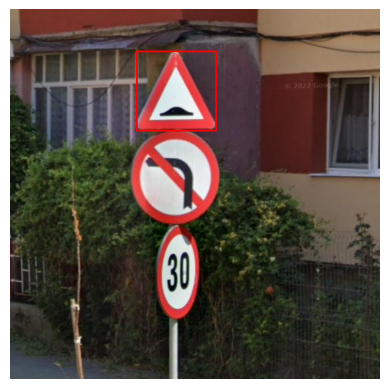

class is : forb_speed_over_60
SNAG12-RADU_412_png.rf.01b8d9d33f7834fb23b343c63c741a32.jpg


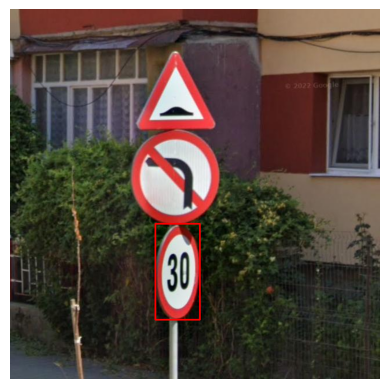

class is : forb_speed_over_70
SNAG8-RADU-0052_png.rf.00217c1b982274cf5611b64cc6734877.jpg


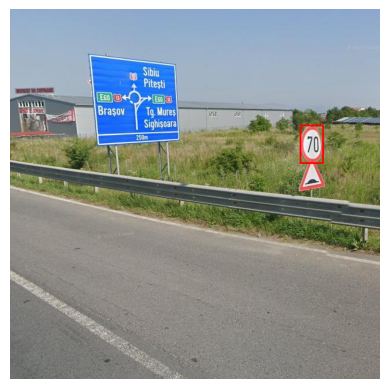

class is : warn_construction
SNAG9-RADU-0171_png.rf.01920b7669120799e55938593fb96ff4.jpg


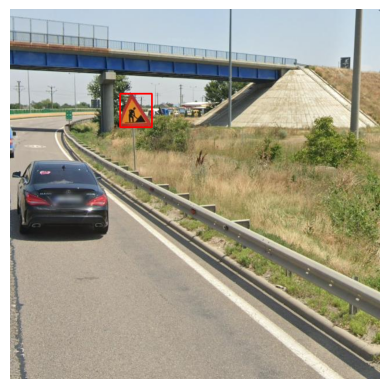

class is : forb_speed_over_50
SNAG2-RADU-0215_png.rf.019116954262e16d14f21bdf671514f6.jpg


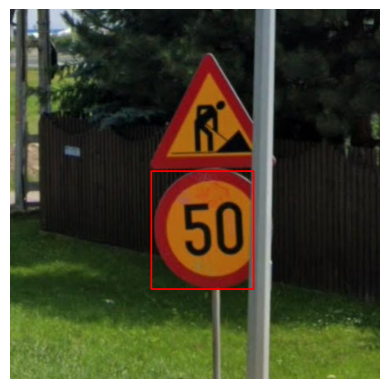

class is : forb_stopping
SNAG-RADU-0390_png.rf.00450e64f66bc5a66d7aa90a3911bc2f.jpg


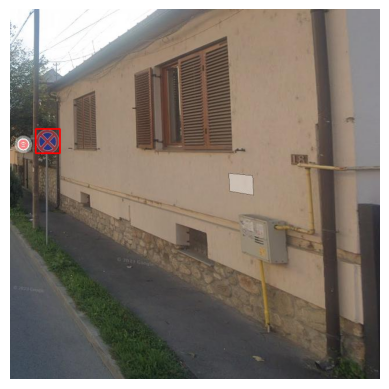

class is : mand_right
SNAG12-RADU_702_png.rf.00f4791e2a7feb3f735c9d447787f594.jpg


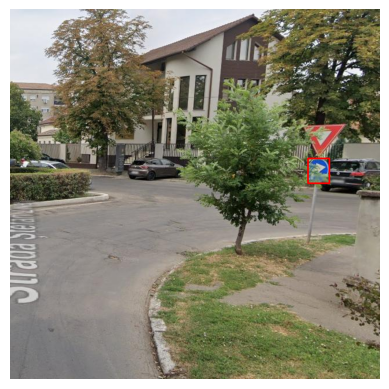

class is : warn_children
SNAG3-RADU-0085_png.rf.00a15a7fdf0266a182ceb884dec9bae3.jpg


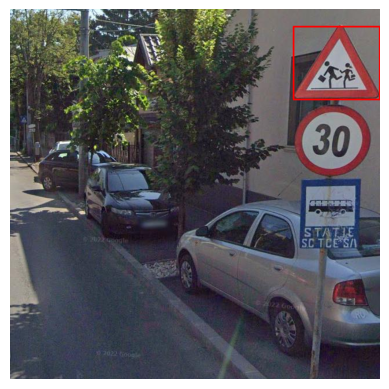

class is : forb_speed_over_30
SNAG3-RADU-0085_png.rf.00a15a7fdf0266a182ceb884dec9bae3.jpg


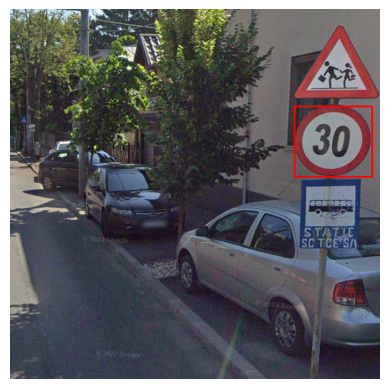

class is : warn_slippery_road
SNAG11-RADU_428_png.rf.01361b34b875d2a82b23d9951ba0ff5c.jpg


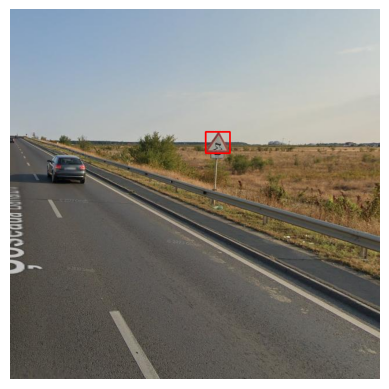

class is : forb_trucks
SNAG12-RADU_385_png.rf.006ccca4fc5cc800b674ce3687671341.jpg


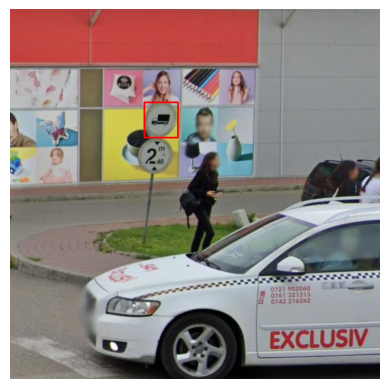

class is : warn_traffic_light
SNAG5-RADU-0105_png.rf.0025f48d80b58008924c4490bc7ed5a5.jpg


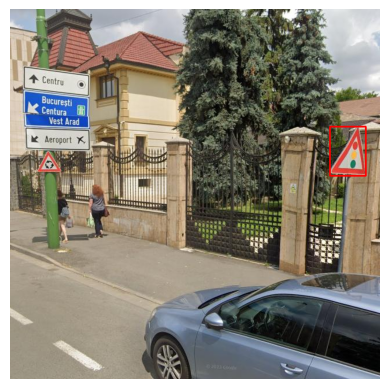

class is : warn_roundabout
SNAG5-RADU-0105_png.rf.0025f48d80b58008924c4490bc7ed5a5.jpg


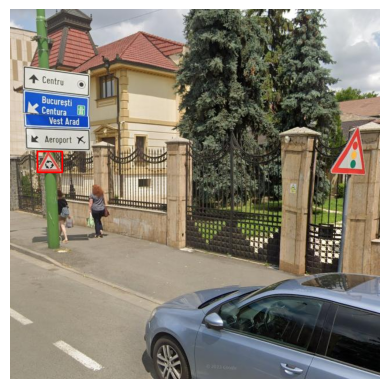

class is : info_highway
SNAG5-RADU-0105_png.rf.0025f48d80b58008924c4490bc7ed5a5.jpg


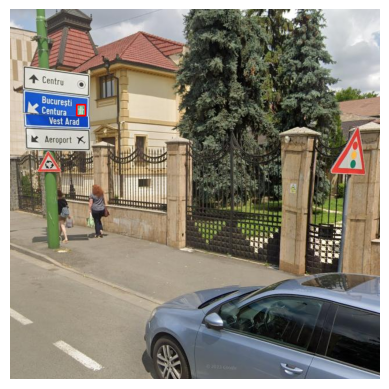

class is : info_one_way_traffic
SNAG-RADU-0332_png.rf.01b73000608b28deb0e412f0596ee6b0.jpg


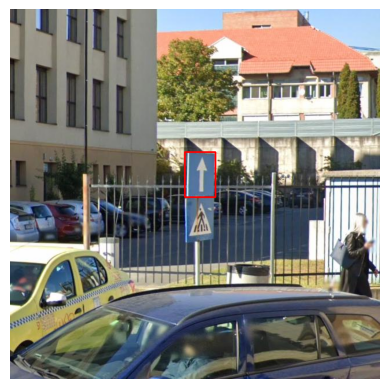

class is : info_crosswalk
SNAG-RADU-0332_png.rf.01b73000608b28deb0e412f0596ee6b0.jpg


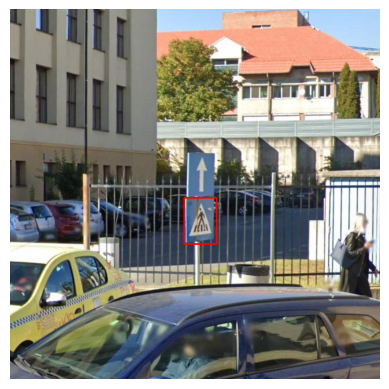

class is : info_bus_station
SNAG12-RADU_286_png.rf.018a8b9712ed4cd6bfd0cf0b7ba2e4ad.jpg


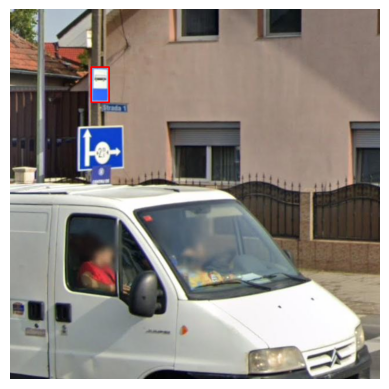

class is : forb_speed_over_40
SNAG9-RADU-0159_png.rf.011fa18c962e8c0a257987190915ab14.jpg


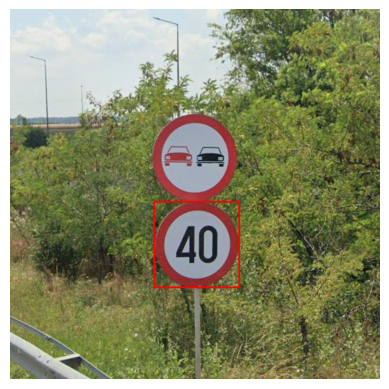

class is : forb_overtake
SNAG9-RADU-0159_png.rf.011fa18c962e8c0a257987190915ab14.jpg


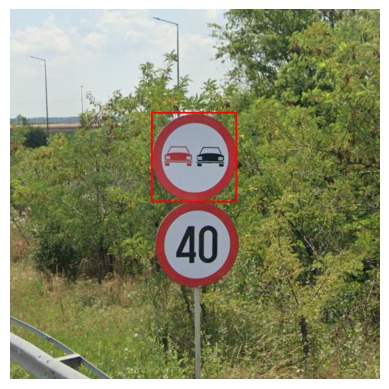

class is : warn_cyclists
SNAG5-RADU-0030_png.rf.02393d1de55172cf5d7a873a8690bb95.jpg


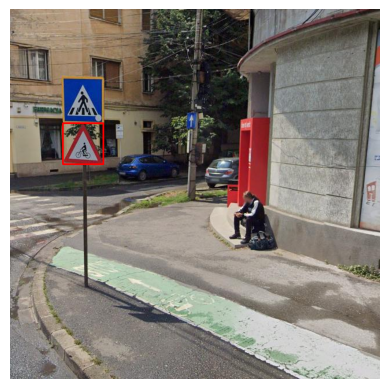

class is : warn_tram
SNAG5-RADU-0054_png.rf.01d13286d3a4adca6c4dd830aaf91352.jpg


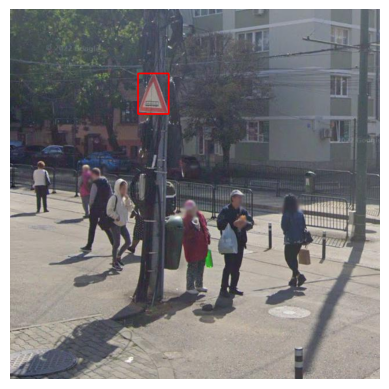

class is : forb_weight_over_7.5t
SNAG11-RADU_238_png.rf.023cad465fbfb81a5dd1cc30eec6576a.jpg


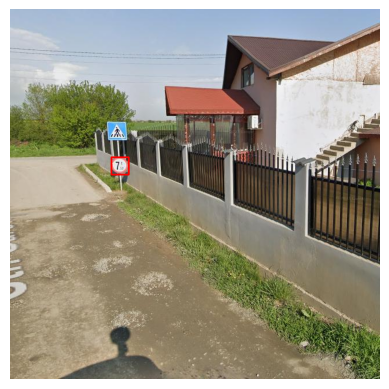

class is : mand_pass_left
SNAG3-RADU-0101_png.rf.02321f8f8ef75ee05b6d24db6f417d07.jpg


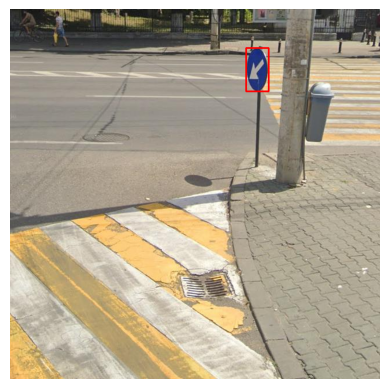

class is : forb_speed_over_90
SNAG7-RADU-0047_png.rf.02bf0bb364bf73f4b840fa11cd37bdc3.jpg


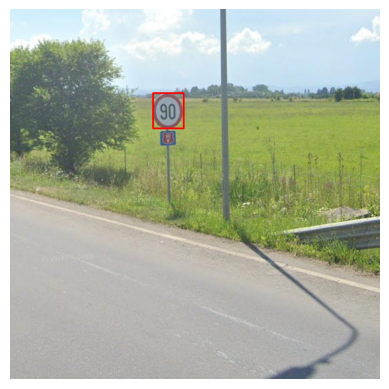

class is : mand_roundabout
SNAG-RADU-0059_png.rf.02a16bf4e539e266d3465834e5edea84.jpg


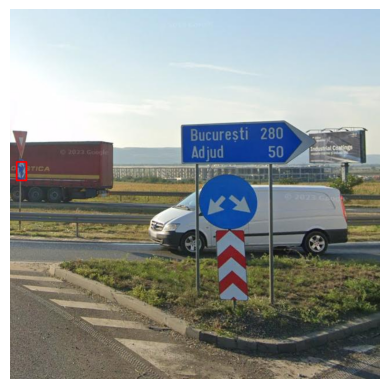

class is : info_taxi_parking
SNAG4-RADU-0087_png.rf.0275bb03456930477c4ca178673d228b.jpg


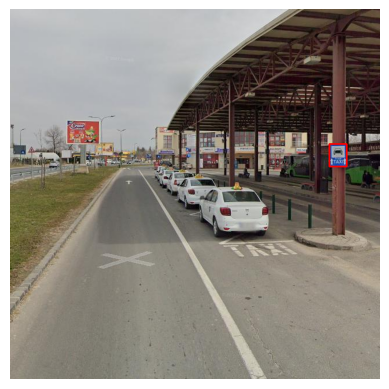

class is : warn_wild_animals
SNAG2-RADU-0001_png.rf.01c4302ef3429e9cbc5b2bd1dca45e3b.jpg


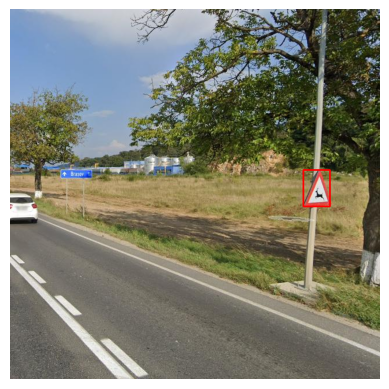

class is : warn_other_dangers
SNAG12-RADU_181_png.rf.02b02ac8a65462ef4d3acf4d136513d5.jpg


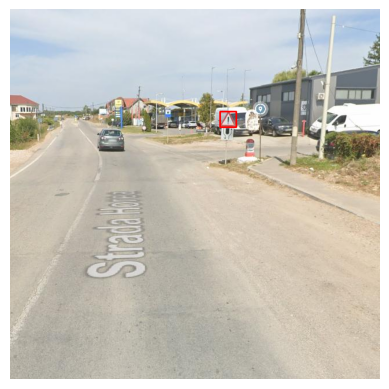

class is : forb_speed_over_10
SNAG7-RADU-0004_png.rf.027a64ddba9470ce473fdb9ba59af751.jpg


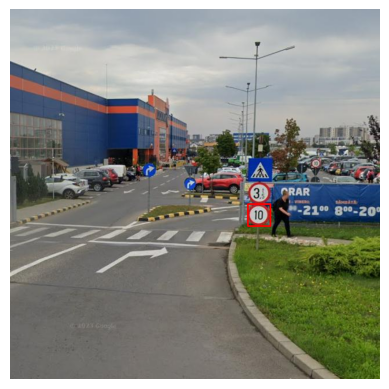

class is : forb_weight_over_3.5t
SNAG7-RADU-0004_png.rf.027a64ddba9470ce473fdb9ba59af751.jpg


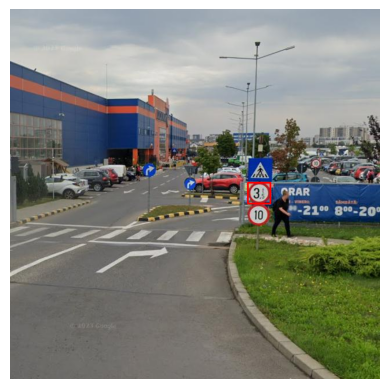

class is : mand_pass_right
SNAG-RADU-0056_png.rf.030568383325ca9dc9308d16dc6bda3a.jpg


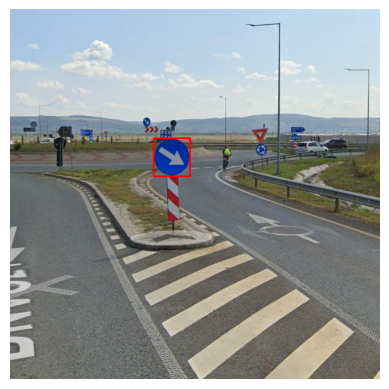

class is : forb_ahead
PIC-00023-_png_jpg.rf.0463d1c7136c29a4c6d8cd91e28048d9.jpg


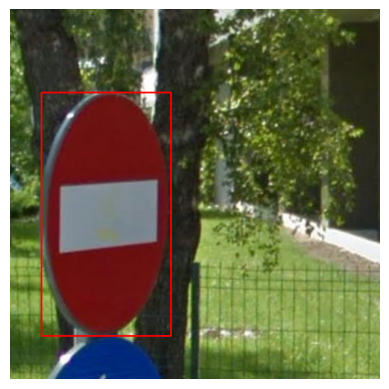

class is : info_parking
SNAG2-RADU-0286_png.rf.03996109d9fc182a1035d89381ca3c85.jpg


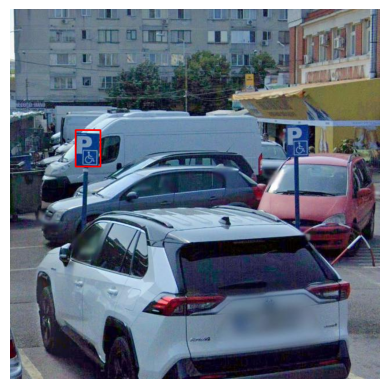

class is : mand_straight
SNAG3-RADU-0170_png.rf.0391134f13307503482ad9ba7958390e.jpg


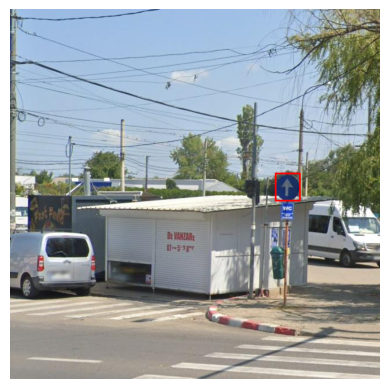

class is : prio_priority_road
SNAG-RADU-0136_png.rf.047c75f57b21a67eaa03e3170e9f29a3.jpg


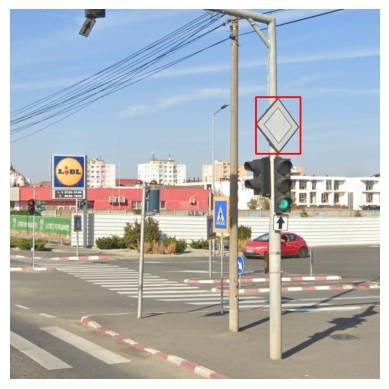

class is : warn_poor_road_surface
SNAG4-RADU-0149_png.rf.04e1f884e0efbd732facb6a8a2d42603.jpg


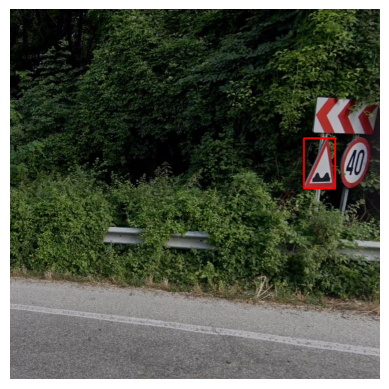

class is : forb_speed_over_5
SNAG12-RADU_573_png.rf.03cd3bf33de4ae9e44a18dc38086f9b0.jpg


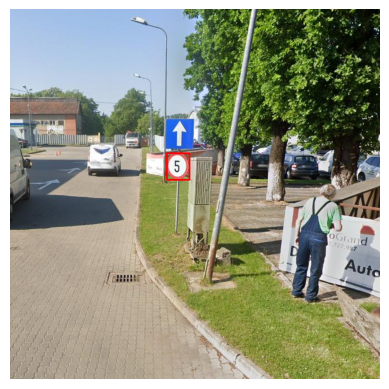

class is : warn_two_way_traffic
SNAG9-RADU-0320_png.rf.0589366600602db7add2f519f27a6dd4.jpg


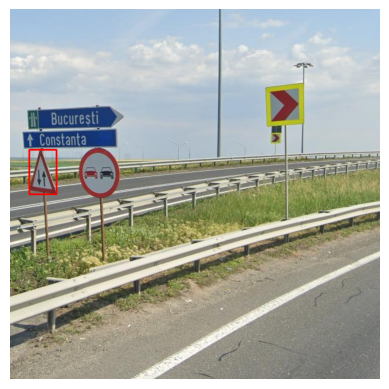

class is : forb_speed_over_130
SNAG9-RADU-0030_png.rf.06593fa9a6518002fe10d3d3d0c6f7e6.jpg


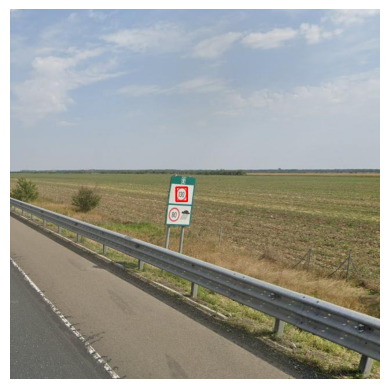

class is : forb_speed_over_80
SNAG9-RADU-0030_png.rf.06593fa9a6518002fe10d3d3d0c6f7e6.jpg


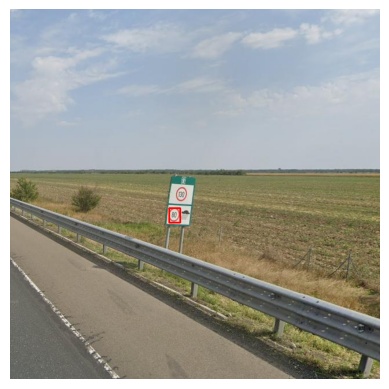

class is : mand_straigh_left
SNAG11-RADU_49_png.rf.064b41eb4d3585984a944c2236771478.jpg


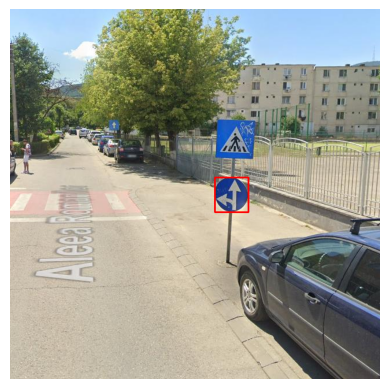

class is : forb_speed_over_20
SNAG11-RADU_404_png.rf.07c71a8bd06e969165f104688bd269d0.jpg


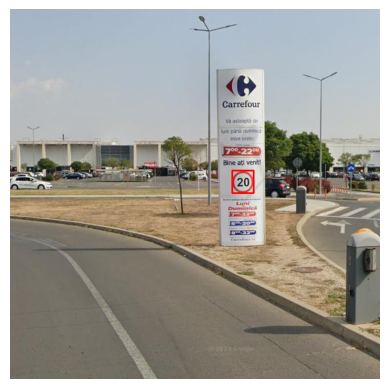

class is : forb_u_turn
SNAG12-RADU_513_png.rf.08ddfb4141702f1ddd2dc55c18058c45.jpg


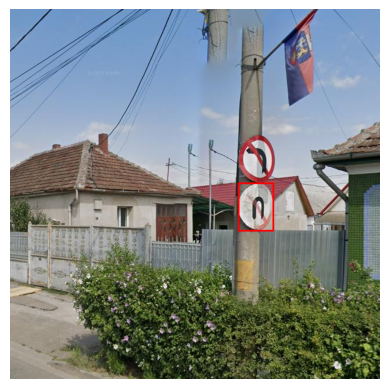

class is : mand_bike_lane
SNAG-RADU-0361_png.rf.083defb372d9395e1d6200d26cfc98ac.jpg


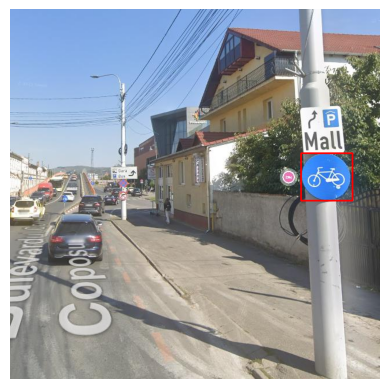

class is : mand_left
SNAG-RADU-0214_png.rf.0a04bce5eca973d1d5404d055bbfb8fe.jpg


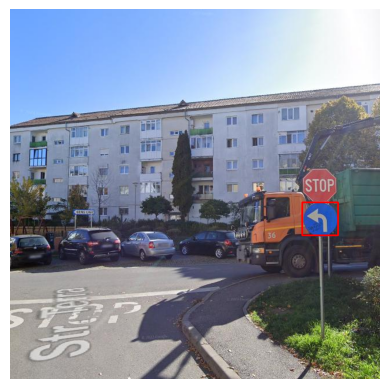

class is : forb_speed_over_100
SNAG9-RADU-0267_png.rf.0ef35dda0cf4967078fb0e3951af3ecc.jpg


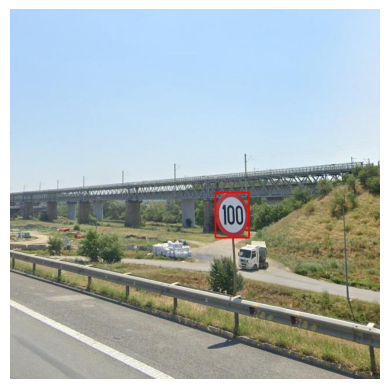

class is : mand_straight_right
SNAG-RADU-0157_png.rf.112d122fc517dd1a4ccbde229064e222.jpg


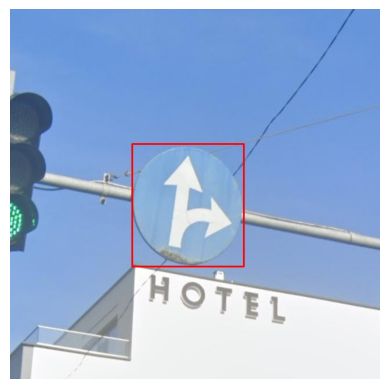

class is : mand_left_right
SNAG11-RADU_108_png.rf.11be3a2c2604f404a6ba13f0c84b6ce3.jpg


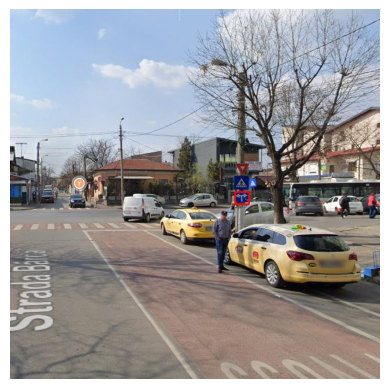

class is : warn_domestic_animals
SNAG4-RADU-0091_png.rf.30eeea4d89e0a21e9b3ab03e51c2d381.jpg


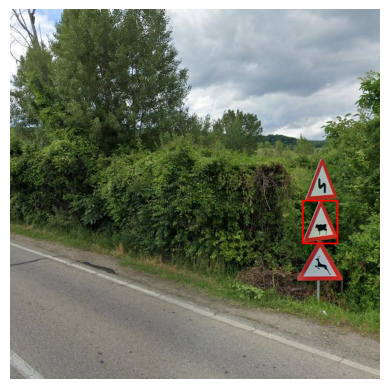

In [222]:
# plot single image of every class
all_classes = train_annotations_df.name.unique()

for curr_class in all_classes:
    curr_class_df = train_annotations_df[train_annotations_df.name == curr_class]
    random_row_number = curr_class_df.index[0]
    
    curr_image_path = src_root + '/train/' + train_annotations_df.file_name[random_row_number]
    curr_bbox = train_annotations_df.bbox[random_row_number]

    print('class is : {}'.format(train_annotations_df.name[random_row_number]))
    print(train_annotations_df.file_name[random_row_number])
    plot_box_on_image(curr_image_path, curr_bbox)
    plt.show()

row number is : 75
class is : forb_overtake
SNAG11-RADU_545_png.rf.03586e5596db969f56069cee3a41dd25.jpg


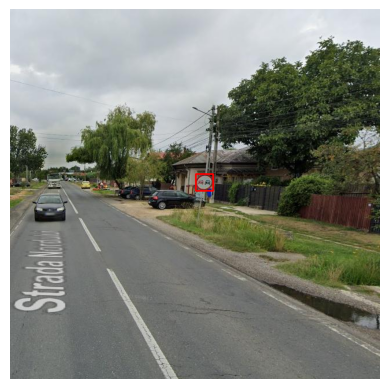

In [146]:
# plot any random image and bbox
random_range = (0, 100)
random_row_number = random.randint(random_range[0], random_range[1])
curr_image_path = src_root + '/train/' + train_annotations_df.file_name[random_row_number]
curr_bbox = train_annotations_df.bbox[random_row_number]

print('row number is : {}'.format(random_row_number))
print('class is : {}'.format(train_annotations_df.name[random_row_number]))
print(train_annotations_df.file_name[random_row_number])
plot_box_on_image(curr_image_path, curr_bbox)

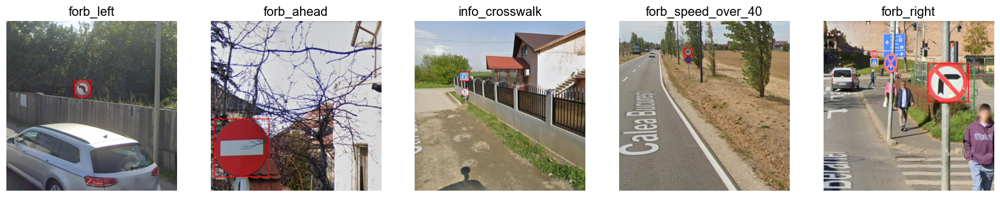

In [153]:
# 10 random images using subplot
row_number = 5
fig, ax = plt.subplots(1, row_number, figsize=(20, 5))
random_range = (0, 1000)
for i in range(row_number):
    random_row_number = random.randint(random_range[0], random_range[1])
    img = cv2.imread(src_root + '/train/' + train_annotations_df.file_name.iloc[random_row_number])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # add bbox
    bbox = train_annotations_df.bbox.iloc[random_row_number]
    cv2.rectangle(img, (int(bbox[0]), int(bbox[1])), (int(bbox[0]+bbox[2]), int(bbox[1]+bbox[3])), (255, 0, 0), 2)
    ax[i].imshow(img)
    ax[i].axis('off')
    ax[i].set_title(train_annotations_df.name.iloc[random_row_number])

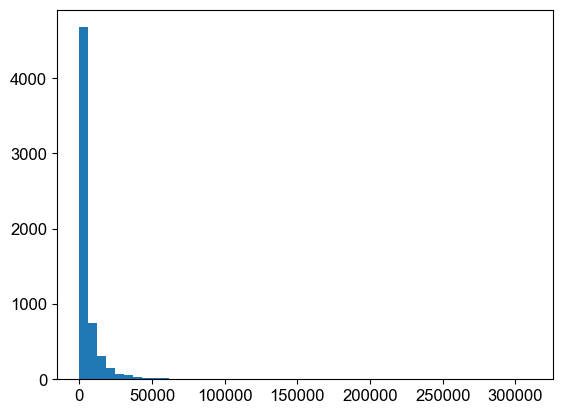

In [223]:
# calculate the area of bbox
train_annotations_df['bbox_area'] = train_annotations_df['bbox'].apply(lambda x: int(x[2])*int(x[3]))
# plot histogram
plt.hist(train_annotations_df['bbox_area'], bins=50)
plt.show()

row number is : 5088
class is : prio_stop
PIC-00029-_png_jpg.rf.ff6018cdcca171364911b4cd75b544c6.jpg


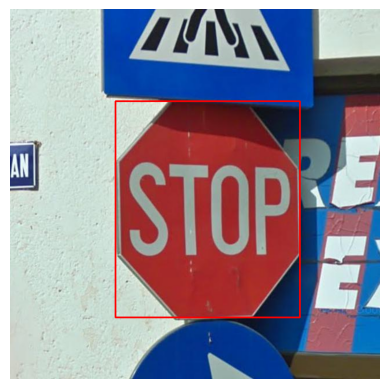

In [169]:
random_row_number = 5088
curr_image_path = src_root + '/train/' + train_annotations_df.file_name[random_row_number]
curr_bbox = train_annotations_df.bbox[random_row_number]

print('row number is : {}'.format(random_row_number))
print('class is : {}'.format(train_annotations_df.name[random_row_number]))
print(train_annotations_df.file_name[random_row_number])
plot_box_on_image(curr_image_path, curr_bbox)

In [170]:
train_annotations_df[train_annotations_df.area > 100000].shape

(11, 10)

In [228]:
print(train_annotations_df.name.value_counts())

name
info_crosswalk            659
prio_give_way             329
forb_speed_over_30        276
forb_stopping             253
prio_stop                 233
info_one_way_traffic      213
info_parking              206
forb_overtake             183
info_bus_station          178
forb_ahead                169
warn_crosswalk            163
mand_pass_right           162
forb_left                 154
forb_speed_over_50        153
mand_right                150
forb_right                146
forb_weight_over_3.5t     131
mand_pass_left_right      131
warn_construction         107
forb_weight_over_7.5t     106
warn_speed_bumper         104
warn_roundabout           104
forb_speed_over_70        103
mand_roundabout            99
prio_priority_road         91
forb_speed_over_5          85
forb_speed_over_40         83
warn_wild_animals          82
forb_speed_over_80         80
warn_children              75
warn_poor_road_surface     75
forb_speed_over_60         72
warn_traffic_light         68
mand_

# Validation Dataset

In [229]:
val_file_json_data.keys()

dict_keys(['info', 'licenses', 'categories', 'images', 'annotations'])

In [236]:
val_images_info_df = pd.DataFrame(val_file_json_data['images'])
print(val_images_info_df.shape)
val_images_info_df.rename(columns = {'id':'image_id'}, inplace = True)
val_images_info_df.head(5)

val_annotations_df = pd.DataFrame(val_file_json_data['annotations'])
print(val_annotations_df.shape)
val_annotations_df.head(2)

val_annotations_df = val_annotations_df.merge(val_images_info_df[['file_name', 'image_id']], left_on='image_id', right_on='image_id')
val_annotations_df = val_annotations_df.merge(classes_df[['category_id', 'name']], on='category_id')
val_annotations_df.head(2)

(1128, 7)
(2027, 7)


,id,image_id,category_id,bbox,area,segmentation,iscrowd,file_name,name
0,0,0,29,"[108, 281, 71, 79]",5609.0,[],0,SNAG12-RADU_867_png.rf.0a7fb2ff64ab52887e3cc6d...,mand_left
1,1,0,41,"[89, 166, 87, 117]",10179.0,[],0,SNAG12-RADU_867_png.rf.0a7fb2ff64ab52887e3cc6d...,prio_stop
